In [1]:
# https://covidtracking.com
# https://covid19.healthdata.org/projections

import requests
import pandas as pd
import numpy as np
import math
import json
from IPython.display import Markdown as md
from datetime import timedelta
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import cufflinks as cf
import qgrid
from pivottablejs import pivot_ui

import os

# Pandas Settings Change
pd.set_option('display.max_colwidth', None)
pd.set_option('display.max_seq_items', 14)
pd.DataFrame._repr_html_ = lambda self: self.to_html(escape=False)

def sparkline(data, figsize=(4, 0.25), **kwargs):
    """
    creates a sparkline
    """
    from matplotlib import pyplot as plt
    from IPython import display
    import base64
    from io import BytesIO
 
    data = list(data)
 
    *_, ax = plt.subplots(1, 1, figsize=figsize, **kwargs)
    ax.plot(data)
    ax.fill_between(range(len(data)), data, len(data)*[min(data)], alpha=0.1)
    ax.set_axis_off()
 
    img = BytesIO()
    plt.savefig(img)
    plt.close()
    return '<img src="data:image/png;base64, {}" />'.format(base64.b64encode(img.getvalue()).decode())

  

# Load State Population file
with open('state_populations.json') as data:
    state_pop = pd.read_json(data)

# Load Available State Hospital Beds (above normal annual hospital activity)
with open('state_hospital_beds.json') as data:
    state_beds = pd.read_json(data)
    
# Pull latest data
states = state_pop['state_code'].to_list()

with open('states_history.json') as data:
    all_state_hist = pd.read_json(data)

drop_states = ["PR",
               "AS",
               "GU",
               "MP",
               "VI",
              ]

for state in drop_states:
    state_pop.drop(state_pop[state_pop.state_code == state].index, inplace=True)
    state_beds.drop(state_beds[state_beds.state_code == state].index, inplace=True)
    all_state_hist.drop(all_state_hist[all_state_hist.state == state].index, inplace=True)
    

#states = ["TN"]
#state_df_list = []

drop_columns = ["total",
                "dateChecked",
                "hash",
               ]

all_state_hist.drop(columns=drop_columns, inplace=True)
all_state_hist.fillna(0, inplace=True)
all_state_hist['date'] = pd.to_datetime(all_state_hist['date'], format="%Y%m%d")
#all_state_hist.columns

In [2]:
#all_state_hist.set_index('date', inplace=True)
all_state_hist['positive_14s'] = 0
all_state_hist['totalTestResults_14s'] = 0
all_state_hist['positiveRate'] = all_state_hist['positiveIncrease'].div(all_state_hist['totalTestResultsIncrease'], fill_value=0)
for state in states:
    #all_state_hist['positive_14s'] = 0
    #all_state_hist.loc[all_state_hist.state == state, ['positive']].rolling(14).sum().shift(-13)
    state_df = all_state_hist[all_state_hist.state == state]
    state_df['positive_14s'] = state_df['positiveIncrease'].rolling(14).sum().shift(-13)
    state_df['totalTestResults_14s'] = state_df['totalTestResultsIncrease'].rolling(14).sum().shift(-13)
    #state_df_list.append((state, state_df))
    all_state_hist.update(state_df['positive_14s'])
    all_state_hist.update(state_df['totalTestResults_14s'])
    
all_state_hist['pos_rate_14a'] = all_state_hist['positive_14s'].div(all_state_hist['totalTestResults_14s'], fill_value=0)
#all_state_hist.head()

## Rolling 14 Day Sum of Positive Cases

In [3]:
pos_trend = all_state_hist.pivot(index='state', columns='date', values='positive_14s')
pos_trend.fillna(0, inplace=True)
pos_trend['Trend'] = pos_trend.apply(sparkline, axis=1)
pos_trend[pos_trend.columns[-8:]]

date,2020-10-19 00:00:00,2020-10-20 00:00:00,2020-10-21 00:00:00,2020-10-22 00:00:00,2020-10-23 00:00:00,2020-10-24 00:00:00,2020-10-25 00:00:00,Trend
state,,,,,,,,
AK,2633.0,2845.0,2783.0,2881.0,2985.0,3107.0,3378.0,"<img src=""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAASAAAAASCAYAAAD7RgOSAAAABHNCSVQICAgIfAhkiAAAAAlwSFlzAAALEgAACxIB0t1+/AAAADh0RVh0U29mdHdhcmUAbWF0cGxvdGxpYiB2ZXJzaW9uMy4yLjEsIGh0dHA6Ly9tYXRwbG90bGliLm9yZy+j8jraAAAFRElEQVR4nO2ay29UVRzHP/c193Y6j5Zppw9pC4UgTxMSEBJcKMbEBws3RqI748KNLly4809wY3BjjDFxoYnGhW6IC1kQIBBENCJC+hAKbel7ZjqP+zrHxZ0pnaZNBCozLeeTTM7jnnPu797kfOf3O7+rSSklCoVC0QD0RhugUCieXJQAKRSbFCkl7339K69/do5QNGegowRIodiEjM2V+ODbq5y+Nskr+7sxdK3RJq2K2WgDFArFo+OHgr/G85y+NskXZ0fwQ4lj6rxzbBvvPre90eatiRIghWIDIqVkZKbI9Yk8f97N88OVO0wVXAB60g7PP93JW0f6ySYd9Cb1fgA0lQVTKDYOFT9kbK7ER9//wW9jCwDoGhwZzHDiQA9daYe9Pam6kCubtNG05hQh5QEpNi0lL2BkusjenlRTewH/BSkln/x8k1NnhgBoi1t8+NIuDva30b8ljmMZDbbw4VACpNh0/DNT5POzI/x4dZxFN+DNQ32YhsaV2/PszCZ5dls72zsSZFM22ztasYzmzcXMFT1O/TLEl+dGATi8rZ1dXUnePtJPJmE32LpHR4Vgig3PnfkSP/0+waXRWaYKLjfvFTB0jWM7OhjPlbk+USAeM9jXm+LWbGnprARgIBPn5OF+TjzTQ29bS0OzRbVznQvDs5wfnuHq2AKTuQpCwtHBLRwdzHDycN8Dh1PNHIIpAVJsSGYXXc7cmGZoapGvzo9S8QU7OlvpSjns6EzwxqGtdKUcvEBwfSLPnp4UMVNHSslkvsJkrsLdhTLfXBpjaGoRiM5Sko7FsZ0Z9vWmCULJrdkiubKPbel0JGwsQ6fFMjANjSCUDHZGHpRlaIzOlCh5AZqmIYRkvuQxu+jhWDp+KCn7Ia4fEgiJbRlowMRCGQBRrRe9EIhE42B/G33tcV7ck2WwM/HQ70oJkEKxjoRC8uqnZ7kxWUADXtid5f3jO+lta3mo9W7Plrh8a47pgstUweXS6NySl9SZsMkkYhTdgHwlwA8FFT9EyEiwVn7fV+szNI24bdCRsPECgWVo2KaBbekYmoYbCISUdCZt5ooef08WeHl/NweeSnNooJ2t7S3rJhpKgBSKB0RKSSgkE7kKw9OLjExHKeeLo3NM5Mr4oeTjE3s4vjtLPLb+R5kVP8Qy9FVDMikloZQEoWS64OKHAj+UZJM27a2xB76XlJKiF5Kw/58jWSVAijVxg5BCJaDshbiBwA8FXq0MBUgwDR3T0IhVS8vQsfRldUPDrJaWrj/WjE/N/qIbUKgELLpRPVf2yZV9ko5FwjbwQ0kgoo0a1NXvP/O9vMt4rsyd+TLjC2XcQNTdK91icbCvjf5MnIFMnNcO9DTtxmomlACtM99dHuPi6Bw1yyVLlSVq1drj3W+vfr1u+op1l+as0b/a+qycC5S9kELFp7Bss3orNtl6oGtUhUnH1DUsU8fSl4nUKkJm6Bqi6nUIAYEQhBKEkARCIkTtX18gZOQh5Cs+FX/97M+0xuhOO3SlHLrTDq2xKIQZyMQZyLTSHreadiM1M80sQBsyDT80vciF4dm6vtr7Xf6eNbT6a0tjtbo2dXNWH3N/jfo1621Ya06EYxl0JKPUb9KxSDomCcckaZvEbZOYoRMzdCwz8nZq6eFASPxQRGUg8GvtqgfhVa8F1VBgaWx1jF/1MqK+Wn/U9gKBGwhCIdE1DUMHQ9dpMY1qW8PUtaV67WebOqkWi1T1OZKORattkLBNEnbUTrdYFCo+JS/EXCaA5jLvLep//J7bk0Szig9sUA9IoVBsDpr3CyyFQrHp+RewhZnJjfX5PAAAAABJRU5ErkJggg=="" />"
AL,13772.0,14051.0,13110.0,15089.0,17451.0,18750.0,19013.0,"<img src=""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAASAAAAASCAYAAAD7RgOSAAAABHNCSVQICAgIfAhkiAAAAAlwSFlzAAALEgAACxIB0t1+/AAAADh0RVh0U29mdHdhcmUAbWF0cGxvdGxpYiB2ZXJzaW9uMy4yLjEsIGh0dHA6Ly9tYXRwbG90bGliLm9yZy+j8jraAAAGJ0lEQVR4nO3aW2wcVx3H8e/cd/bivdjrJLYTu7FTq6EQ0hgosUpbguAJKhASqvpQBYFUCVU88cIrSCDxSiUeQPCCQCoSL1xU0VJQCWlSEgiQ2G3sOPGlzq7t3fVe5354WNu1VTstyOna+Hyk1Wj2zOz+x57z2zNnRhFCCCRJkjpA7XQBkiQdXHqnC5Ck3TBVrHH1ToVr8xVemShyJB1j9HCKTw53k09a9GdtYoZGb8pCUZROlyutUeQlmLSfXblT4vu/n+SN22UAEqbGh/rTeEHEVLFO3Q22bD/UHefzp/p4YrSX0cMpEqYmA6mDZABJ+44Qglcmirx4ZY6XrhfIxA3Onx3i7HAPAzkbdS1Qgihiutig4QZML9Vx/IjXb61wdbZMtOmsz9gG4yM9nB8fYmwo16GjOphkAEn7huOHXJop8cKrU1yeKZGK6XzxdD9fHX8A29Te9+dUmh6v3Vzmu7+dwNAUzj10iMszJVZbPt88d4KnP36MfMq6j0fywbi76vCLy7OYuso3nhzpdDnbkgEk7XlVx+fVySIv/HGKt4p1snGDrz92nKdO96Gr//t9lPlyk7ipk0uY1N2A7/zmBn96c4mumM7znz5Byw85nk/wmYcOUXV8elOxjX3frrS4OL3C67dWKNRcBnNxLkwtk7A0ThxK8dmTh3n8wfx/FYy7aXG1xVM/vECx5jI+0s3Pv/ZoR+p4LzKApD3JDyOuzVW4MLXCz/46Q7np050wef7cCJ86kSdh7f79EyEEk3dr/OClN7n+dnVLW9zU+NVzZwkjwbd//U/+tdBuT9sGPUmThUqL4XySuKlxbW4VL4wYySf5wkf7ODvczamjGQxt57BsegHTxQZHc+3Jcj+MmC01qTkBlaZHJm7iBRE9SYuTfV0b9YaRQFMVHD8iZqgUqi6Vlsf3fjfJpZkVfvzsGOPDPXt2nksGkLRnuEHI1TsVfvKXGS5OL9PwQhTg9LEMzz0+zMP9aTT1/nckIQR3qw4Z2+SXb8zyoz/f2tLekzR55hODjA1lGelNbsw5rSs1PC7PlPjphRlurzQBUBR4uK+L4/kkR9I2fhhRdwKKNQdTV/n3QpWFSut91XdmMIulqyxUWsyXW5iaSssPsQ2Nlh9ubPetz43y5TMDe/rOnwwg6QMRhBHz5Ra6puAGEYsVh2vzFVZbPkIIJhZr/GOuQt0NyMYNnhzt5WMP5DhzLEs6bnS09kgIbhbqXJ0t4/oRX3qkny77vWsSQlB3A167uczsSpOXJwq0/JByw8cyVGxToydh4UcRqqLwlbGjVB2fMBKoqsLhrhi22X50oNL0EQgmF2u8PFEgZmikbYP+jA1A0tKpOj7HcnHqboAQcH58CEVRZABJB08YCd4q1Lhyp8yNxSp/uF5gqe6+aztLV3GDiGzc4InRXsYGszx6vJtkTD6itltkAEn7mhC

## Rolling 14 Day Average of Daily Positive Test Rate

In [4]:
rate_trend = all_state_hist.pivot(index='state', columns='date', values='pos_rate_14a')
rate_trend.fillna(0, inplace=True)
rate_trend['Trend'] = rate_trend.apply(sparkline, axis=1)
rate_trend[rate_trend.columns[-8:]]

date,2020-10-19 00:00:00,2020-10-20 00:00:00,2020-10-21 00:00:00,2020-10-22 00:00:00,2020-10-23 00:00:00,2020-10-24 00:00:00,2020-10-25 00:00:00,Trend
state,,,,,,,,
AK,0.046316,0.042367,0.048768,0.050071,0.050020,0.058082,0.059292,"<img src=""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAASAAAAASCAYAAAD7RgOSAAAABHNCSVQICAgIfAhkiAAAAAlwSFlzAAALEgAACxIB0t1+/AAAADh0RVh0U29mdHdhcmUAbWF0cGxvdGxpYiB2ZXJzaW9uMy4yLjEsIGh0dHA6Ly9tYXRwbG90bGliLm9yZy+j8jraAAAHaElEQVR4nO3bW2wU1xnA8f/Mzu7M3n1be9cXbAzEbjAYnKZJENCQKoGACBFFohWRWlWJkGj7SB9aqQ8QNQ+oVRIlTfpApFZBVS6ijQA14YGQxoFgU5QabDC28QVf1/bae53dndmZPpA4uAUSCr6A5/c0Mzua8432zDffOWdXME3TxGKxWOaAONcBWCyWhctKQBbLferiUIyn/vAJO/90eq5DuSkrAVks9yE9Z/DisTZ6Iym21oeYrzMt0lwHYLFY7kw8rfHe2X6cDht+p52YqrH/WBvJTI4X1i1m1yOVCIIw12HekJWA7iGxtMaBD9tJZHQO7FiJZLMK2IVOzxn86v0W/nFheNrxB0o8bFkRYmt96RxF9u0I1irY7ElldVyO28v5GT3HB18Mcrx1mI6RBL2RFAA+RaIs38m7ux/Dq9hnIlzLDNByBvY7eHF0jMQ50jKET5EIxzN83jVOy0CU7avL+H5NgEvDcd5p7uONXQ9RVeQGoNgrz9sKyEpAs6R9OM7Gl//JrzfX8nhNMdVFbpp7JvjzqR52PbqIdcsCU+cORVX2HWmjfyJF62AM47pv6OWdqzg/EOVgYzcAbz7XwKa60GzfjuU2GYbJttcbuTgU5+3nH+HR6sIbnmeaJvGMjtshkTNM7DaBw+cG+OPJTmJpnaiqkdWNqfMdNpG9m2p45rpKxzBNxOsSjpWALLz+cScHPmqf2vcpErG0PrVfG/Si5QzGE1lEQSCSyuJ32tm2qpTaoJeAV8YjS1QHPABEkll2vHmKZ+pLeWn7ylm/n/nEMEwONfVRke/k4aoC3LLE5ZE4l4bjlPoVGhblI4pz+wC2DkbZ8mrj1H5VoYuNdUGuRlKU57vYvb6aloEovzt2kY5wgq/CDXhlRmIZaoNefIqdgE9m9/pqFLsNl8OGnjNxOmy3bNtKQAtc73iSza98SjKbA8DvtLNuWRFrlhSyrMTLu81XOdoyhN9ppzzfiarl+MWGpTRU5t/yur/523mauiOc3LuBArdjNm5l3tBzBhcGY1waivFpxxjHzg8B4HbYqAl6Odc3OXXuynI/dWV+oqrG6oo8Nq8IkdZyDE6mWb0oD7d882HxZCqLKApkdYMzVyK88Uknes6kstDF03UhBiZVnq4LTr0YbuZgYzf7j7bx4rN1NHVH6B1P8u/+KCG/QjiWwcTEMGFxkYunHgzSNhRjJJbGMOGHDWU8u7psWlVzO6wEtICd7Ymw59A5wvEM21aVsqzYw46Hyv+nQ0wkszgdNhT7rd9m1+sKJ3ju4BlsosAL66rZu7Fm3na0uyWt5RiKptl/pJUT7aMAyJLIj75XQV2pnw8vDNM1muDJB0vYUFNMy0CUd5r7iCQ13LLE4KQ67Xohv8LPNyxlZbmfqxGVxs4xFLvIijI/J9tHOdoyOG0IvLjQRXmBi9bBGJFkFoAf1BZz8KcP86/eCTrDcaKqhigIjMTSDEyqXI2oXBlNkOdycHjPmqlrZXUDhyTSFU7w9y8GKPYp7PxuBQ7p7i4uWAlogfrL6R5++0ErboeNV368mhVl/rvexpnucd7+vI+m7giH96yhYdGtq6Z7Ue94kr5Iircauzl5eZSveuxP1lSyrb6MIq8DWfp2ifviUIxLw3EErlWib33WzeWRxNTnbvnasCajG7gcNrbWlxLwyiiSiM9pZ/2yAE6HDTWbozOc4OP2MIfO9LEk4KZrNDmtLVkSCfoUQnkKQZ/Chtrim879zCQrAS1AOcNk1b7j1Aa9vLR9xYyuVCUzOltebaShMo/n11ZTG/IS8jtnrL0bMQyTcDzD2d4I/RMqJy6FiaoaVYUu3LKET7FT4lNIazmWFnuoLHRRVeTGZbch2URSWZ3+CZWzPROc65ugbTDGlbEEimRjUtUA8CoS2xvKCPoUxhJZfra2Ckm882qhuTvCYFSlPN9FXZkPgJ6xFIsKXN84vxJVNX5/vJ1IMstjSwp5orYYr2LHNE08sjQvHnwrAS1A5/ujbH2tkX3blrNxeXDG2/trUx+vnehEN0wEAerL86gOuKnId1HocVDgduB32hEFgXA8jcsh4ZUl3LKER7m2LdttiAKIgoAoCAgC2MRr2znDZCKVRTdMxuIZTl8Zp2MkwXBUZfjLoUZa+3p1JuRXWBLw0D+RQtVyxNM6qS/nwP6bQxKnrewUuB08UOKhIt9FIqOzvNRHsVdhVUUefpf1k4PbZSWgu+y9s1dp6o7MdRi31DOepLlngqO/XEvAK89Km1FVo3c8yamucc73R+mLpAjHMzPWXsAjU+KXKXLLlOY5Kct3Uhv0Uh1w47TbpnV60zRJawaSTaBjJMFQVGUkliGV1VG1HF7ZTihPYWnAQ3XAPW8fmHvRfE5A9+QvoTtHE3zWOTbXYXyjTcuDfCfkm7X2ijwySwIenqgtmTqm5wwmUxqRVJaYqpHRDUJ+BVXLkUjrJLM6ibROIqOT1oyp1RjDNDGMr7cFBPJddiSbiN0m8HhN8f+98jbbw8OFbr4mH7hHKyCLxXJ/sP5MZLFY5sx/AP0LBU9UKmvjAAAAAElFTkSuQmCC"" />"
AL,0.148747,0.151529,0.141416,0.157202,0.187000,0.204811,0.205193,"<img src=""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAASAAAAASCAYAAAD7RgOSAAAABHNCSVQICAgIfAhkiAAAAAlwSFlzAAALEgAACxIB0t1+/AAAADh0RVh0U29mdHdhcmUAbWF0cGxvdGxpYiB2ZXJzaW9uMy4yLjEsIGh0dHA6Ly9tYXRwbG90bGliLm9yZy+j8jraAAAFpUlEQVR4nO3bXYhcZx3H8e/znHPmnDMzZ3Y2u8lmN91mU9qLmFikFEutLyAigoIWhF6IWFoUb7wQvPVCvBC9Eq/qreRG6oUgRZSIBoTEl0BfSEPSJmY3yW52JzO783Zen/M8Xsxm2zRtYtqOs0meDwyHw5mZ539ent88D2eOMMYYLMuyJkBOugDLsh5cNoDG7Henr/CFX/yVYaYmXYpl7To2gMYozhU/evk1ljsxq1vJpMuxrF3HBtAYXd18J3S6STHBSixrd7IBNEbvDh0bQJZ1KxtAY9RLbQBZ1u3YABojOwKyrNuzATRG3dgG0INOlZpTF9v0U3v+34876QLuZ710dOvdd6UNoAdArjR/f7vFwZkaj8zW+NOZa/zqL2/z5loPgOeeXOTn33x8wlXuLjaAxqibFISew1To2QC6j2ltOPaPZY6dWub8+gApYKEZcmUzYXE65LufO8Qrb6zx+1ev8pOvHyHwnEmXvGvYABqjblIQBS5R4NL7kAFkjCFT+oG+aG88LSSEAEYdfpgrBplikCr6mSLJS5Q2bMU5lzsxeWnIlaYo9U1LKQW1ikPVd/GkoD3MeXRfnQPNkE8tNtnXCO6qtlY/4/vHTnN6eZOp0OOFZ5a4PshZ6ya8+NlDfPnIHK6UfGKhwQ9/+xq/PP4WLzyzdNft3K04V/zm5DInL7R5eE+Vn3

## Charts

In [5]:
rate_trend.drop(columns="Trend", inplace=True)

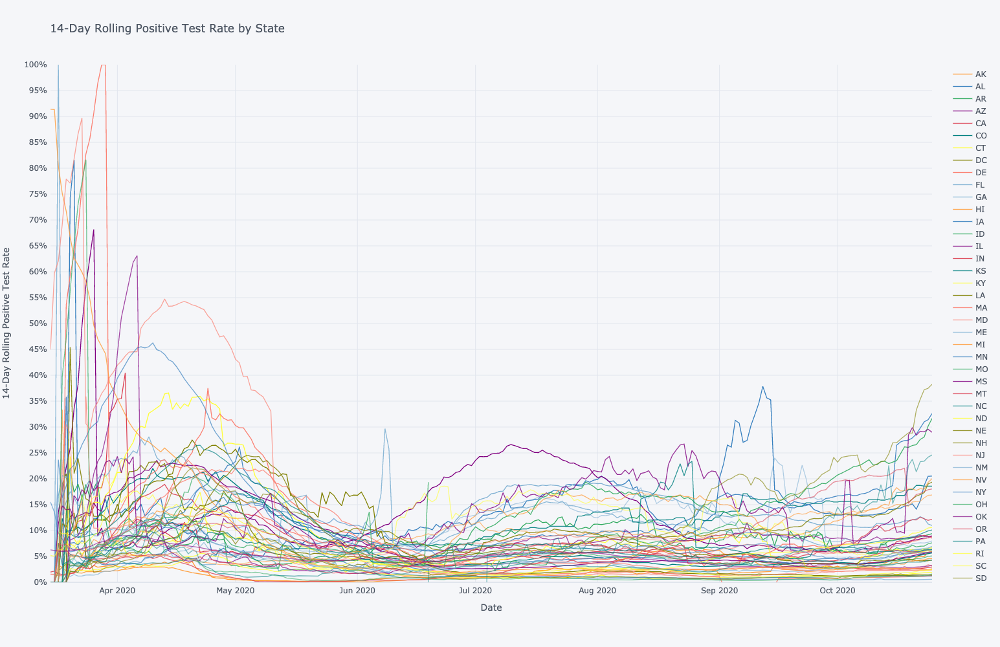

In [6]:
#covid_sort = covid.sort_values(by='positiveShareDelta', ascending=False)
#covid_sort['polarity'] = covid_sort['positiveShareDelta'] < 0
#colors = []
#for polarity in covid_sort.polarity.values:
#    if polarity:
#        colors.append("green")
#    else:
#        colors.append("red")
#fig = go.Figure()
#fig.add_trace(go.line(x=covid_sort.state, y=covid_sort.positiveShareDelta, marker_color=colors))
#fig.layout.xaxis.tickfont.size = 8
#fig.layout.yaxis.tickformat = '0.0%'
#fig.update_layout(title_text='Share of Positive Tests vs Share of Population Delta')
#fig.update_layout(
#    autosize=False,
#    width=800,
#    height=800,
#    margin=dict(
#        l=50,
#        r=50,
#        b=100,
#        t=100,
#        pad=4
#    ),
#)

#rate_trend.drop(columns="Trend", inplace=True)
line_graph = all_state_hist.pivot(index='date', columns='state', values='pos_rate_14a')
line_graph.fillna(0, inplace=True)
#line_graph.head()
#all_state_hist[['state', 'pos_rate_14a']].groupby(["state"]).head()

fig = line_graph.loc['2020-03-15':].iplot(asFigure=True, xTitle="Date", yTitle="14-Day Rolling Positive Test Rate", title="14-Day Rolling Positive Test Rate by State")
fig.layout.yaxis.tickformat = '0.0%'
fig.update_yaxes(range=[0,1], dtick=0.05)
fig.update_layout(
    autosize=False,
    width=1200,
    height=1000,
    margin=dict(
        l=50,
        r=50,
        b=100,
        t=100,
        pad=4
    ),
)
fig.show()

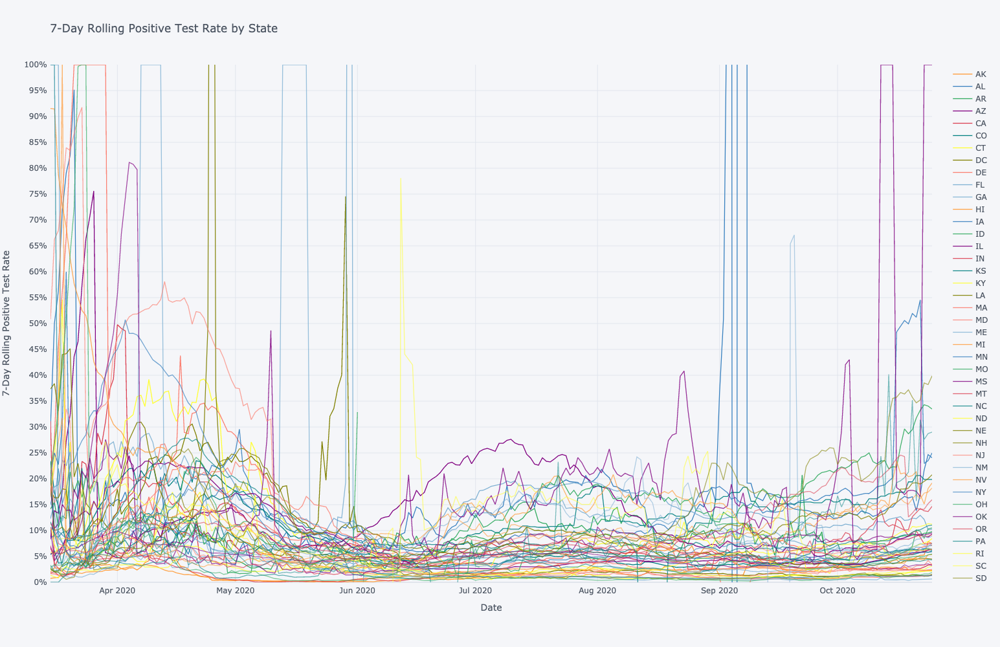

In [7]:
#all_state_hist.set_index('date', inplace=True)
all_state_hist['positive_7s'] = 0
all_state_hist['totalTestResults_7s'] = 0
for state in states:
    #all_state_hist['positive_14s'] = 0
    #all_state_hist.loc[all_state_hist.state == state, ['positive']].rolling(14).sum().shift(-13)
    state_df = all_state_hist[all_state_hist.state == state]
    state_df['positive_7s'] = state_df['positiveIncrease'].rolling(7).sum().shift(-6)
    state_df['totalTestResults_7s'] = state_df['totalTestResultsIncrease'].rolling(7).sum().shift(-6)
    #state_df_list.append((state, state_df))
    all_state_hist.update(state_df['positive_7s'])
    all_state_hist.update(state_df['totalTestResults_7s'])
    
all_state_hist['pos_rate_7a'] = all_state_hist['positive_7s'].div(all_state_hist['totalTestResults_7s'], fill_value=0)
#all_state_hist.head()
line_graph = all_state_hist.pivot(index='date', columns='state', values='pos_rate_7a')
line_graph.fillna(0, inplace=True)
#line_graph.head()
#all_state_hist[['state', 'pos_rate_14a']].groupby(["state"]).head()

fig = line_graph.loc['2020-03-15':].iplot(asFigure=True, xTitle="Date", yTitle="7-Day Rolling Positive Test Rate", title="7-Day Rolling Positive Test Rate by State")
fig.layout.yaxis.tickformat = '0.0%'
fig.update_yaxes(range=[0,1], dtick=0.05)
fig.update_layout(
    autosize=False,
    width=1200,
    height=1000,
    margin=dict(
        l=50,
        r=50,
        b=100,
        t=100,
        pad=4
    ),
)
fig.show()

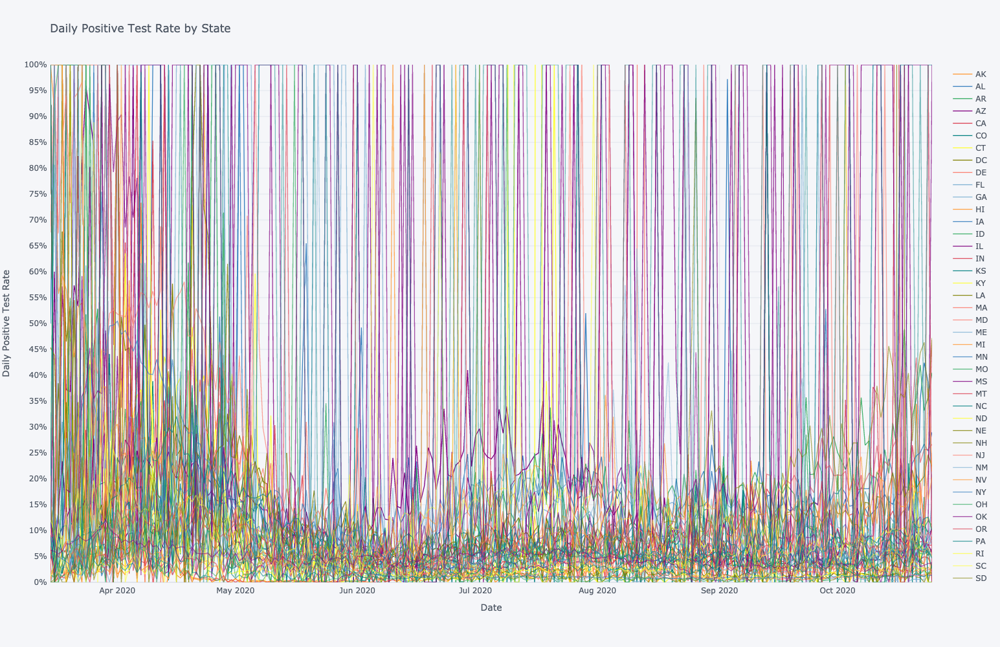

In [8]:
#all_state_hist.head()
line_graph = all_state_hist.pivot(index='date', columns='state', values='positiveRate')
line_graph.fillna(0, inplace=True)
#line_graph.head()
#all_state_hist[['state', 'pos_rate_14a']].groupby(["state"]).head()

fig = line_graph.loc['2020-03-15':].iplot(asFigure=True, xTitle="Date", yTitle="Daily Positive Test Rate", title="Daily Positive Test Rate by State")
fig.layout.yaxis.tickformat = '0.0%'
fig.update_yaxes(range=[0,1], dtick=0.05)
fig.update_layout(
    autosize=False,
    width=1200,
    height=1000,
    margin=dict(
        l=50,
        r=50,
        b=100,
        t=100,
        pad=4
    ),
)
fig.show()